### Imports

In [72]:

import pandas as pd
import numpy as np
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import time
import matplotlib
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
sns.set_style('darkgrid')
import shutil
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization,Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
import time
from sklearn.metrics import f1_score
from IPython.display import YouTubeVideo
import sys
if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', None)  # or 199
print('All modules have been imported')
from tqdm import tqdm

from FungAI.ml.params import LOCAL_DATA_PATH
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True # important to avoir an error (the truncated picture error)

All modules have been imported


## Defining functions for model analysis and development

### Model that prints value counts per column

### Creating Data Frames for Model

In [78]:
def make_dataframes(train_dir):
    bad_images=[]
    dirlist=[train_dir]
    names = ['train']

    for name,d in zip(names, dirlist):
        filepaths=[]
        labels=[]
        classlist=sorted(os.listdir(d) )       
        for klass in classlist:
            classpath=os.path.join(d, klass)           
            flist=sorted(os.listdir(classpath)) 
            desc=f'{name:6s}-{klass:25s}'
            for f in flist:
                fpath=os.path.join(classpath,f)
                try:
                    filepaths.append(fpath)
                    labels.append(klass)
                except:
                    bad_images.append(fpath)
        Fseries=pd.Series(filepaths, name='filepaths')
        Lseries=pd.Series(labels, name='labels')
        df=pd.concat([Fseries, Lseries], axis=1) 
        
        pdf=df
        train_df, dummy_df=train_test_split(pdf, train_size=.8, shuffle=True, random_state=123, stratify=pdf['labels'])
        valid_df, test_df=train_test_split(dummy_df, train_size=.5, shuffle=True, random_state=123, stratify=dummy_df['labels'])
                
    classes=sorted(train_df['labels'].unique())
    class_count=len(classes)

    return train_df, test_df, valid_df, classes, class_count


train_dir= r'raw_data/Mushrooms/'

train_df, test_df, valid_df, classes, class_count=make_dataframes(train_dir)

In [63]:
print(valid_df.shape)
print(test_df.shape)

(671, 2)
(672, 2)


### Creating a function that trims that excess data and only calculates based on a Floor lvl number

In [65]:
def trim(df, max_samples, column):
    df=df.copy()
    groups=df.groupby(column) 
   
    trimmed_df = pd.DataFrame(columns = df.columns)
    groups=df.groupby(column)
    for label in df[column].unique(): 
        group=groups.get_group(label)
        count=len(group)    
        sampled_group=group.sample(n=max_samples, random_state=123,axis=0)
        trimmed_df=pd.concat([trimmed_df, sampled_group], axis=0)
        
    
    return trimmed_df

max_samples=240
column='labels'
train_df = trim(train_df, max_samples, column)

In [62]:
train_df.shape

(2160, 2)

### ** This function to balance by augmentation is not used at first ** 

### We create the new data sets with the 'flow_from_dataframe' - keras
### 

In [79]:
def make_gens(batch_size, ycol, train_df, test_df, valid_df, img_size):
    trgen=ImageDataGenerator()    
    t_and_v_gen=ImageDataGenerator()
#Create the training set based on the training_df created above
    train_gen=trgen.flow_from_dataframe(train_df, x_col='filepaths', y_col=ycol, target_size=img_size,
                                       class_mode='categorical', color_mode='rgb', shuffle=True, batch_size=batch_size)

#Create the validation set based
    valid_gen=t_and_v_gen.flow_from_dataframe(valid_df, x_col='filepaths', y_col=ycol, target_size=img_size,
                                       class_mode='categorical', color_mode='rgb', shuffle=False, batch_size=batch_size)

#CREATING TEST SET

    # for the test_gen we want to calculate the batch size and test steps such that batch_size X test_steps= number of samples in test set
    # this insures that we go through all the sample in the test set exactly once.
    
    length=len(test_df)
    test_batch_size=sorted([int(length/n) for n in range(1,length+1) if length % n ==0 and length/n<=80],reverse=True)[0]  
   
    

    test_gen=t_and_v_gen.flow_from_dataframe(test_df, x_col='filepaths', y_col=ycol, target_size=img_size,
                                       class_mode='categorical', color_mode='rgb', shuffle=False, batch_size=test_batch_size)

    return train_gen, test_gen, valid_gen




ValueError: could not broadcast input array from shape (30,200,280,3) into shape (30,)

In [67]:
img_size=(200,280)# reduce image size to reduce training time but is a trade off because it may reduce model performance
batch_size=30
ycol='labels'
train_gen, test_gen, valid_gen= make_gens(batch_size, ycol, train_df, test_df, valid_df, img_size)

Found 2160 validated image filenames belonging to 9 classes.
Found 671 validated image filenames belonging to 9 classes.
Found 672 validated image filenames belonging to 9 classes.


### Function that previews test images

In [68]:
def F1_score(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

### Creating the Efficient Model B3

In [73]:
def make_model(img_size=(200,280), lr=0.001, mod_num=3):  
    img_shape=(img_size[0], img_size[1], 3)
    if mod_num == 3:
        base_model=tf.keras.applications.efficientnet.EfficientNetB3(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max') 
        msg='Created EfficientNet B3 model'
    else:
        base_model=tf.keras.applications.efficientnet.EfficientNetB7(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max')
        msg='Created EfficientNet B7 model'   
   
    base_model.trainable=True
    
    
    x=base_model.output
    x=BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
    x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
                    bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
    x=Dropout(rate=.4, seed=123)(x)      
    x = Flatten()(x)
    output=Dense(9, activation='softmax')(x)
    
    model=Model(inputs=base_model.input, outputs=output)
    
    
    model.compile(Adamax(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy', F1_score, 'AUC']) 

    
    return model

lr=.001
model=make_model(img_size, lr) # using B3 model by default

In [70]:
from tensorflow.keras.callbacks import EarlyStopping

es = EarlyStopping(monitor = 'val_accuracy', 
                   mode = 'max', 
                   patience = 5, 
                   verbose = 1, 
                   restore_best_weights = True)

## Training the model

In [27]:
history=model.fit(x=train_gen,   epochs=50, verbose=1, callbacks=[es],  validation_data=valid_gen,
               validation_steps=None,  shuffle=False,  initial_epoch=0)

Epoch 1/50
72/72 [==============================] - 230s 3s/step - loss: 9.1480 - accuracy: 0.4370 - F1_score: 0.4115 - auc: 0.8127 - val_loss: 8.3755 - val_accuracy: 0.5708 - val_F1_score: 0.5554 - val_auc: 0.9010
Epoch 2/50
72/72 [==============================] - 206s 3s/step - loss: 7.1413 - accuracy: 0.7352 - F1_score: 0.7145 - auc: 0.9586 - val_loss: 6.9199 - val_accuracy: 0.6796 - val_F1_score: 0.6829 - val_auc: 0.9458
Epoch 3/50
72/72 [==============================] - 206s 3s/step - loss: 5.9296 - accuracy: 0.8639 - F1_score: 0.8499 - auc: 0.9890 - val_loss: 5.8600 - val_accuracy: 0.7362 - val_F1_score: 0.7412 - val_auc: 0.9611
Epoch 4/50
72/72 [==============================] - 198s 3s/step - loss: 4.9947 - accuracy: 0.9301 - F1_score: 0.9191 - auc: 0.9968 - val_loss: 5.0856 - val_accuracy: 0.7571 - val_F1_score: 0.7550 - val_auc: 0.9667
Epoch 5/50
72/72 [==============================] - 196s 3s/step - loss: 4.2667 - accuracy: 0.9458 - F1_score: 0.9330 - auc: 0.9982 - val_lo

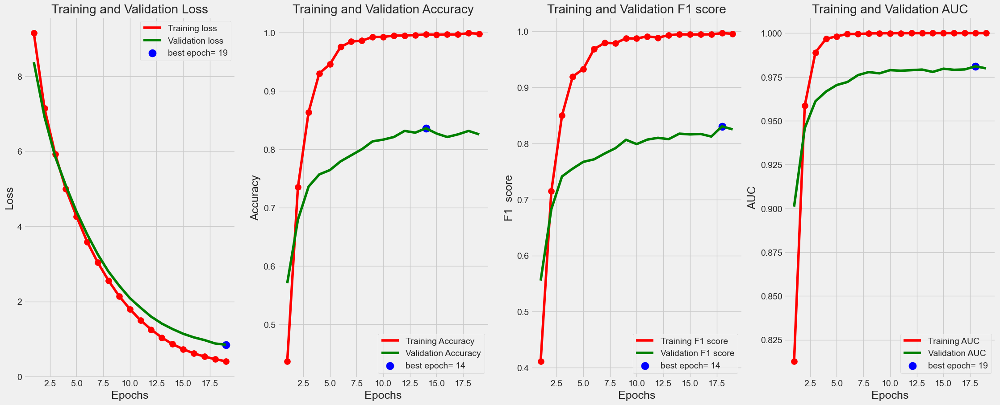

In [28]:
def tr_plot(tr_data):
    start_epoch=0
    #Plot the training and validation data
    tacc=tr_data.history['accuracy']
    tloss=tr_data.history['loss']
    vacc=tr_data.history['val_accuracy']
    vloss=tr_data.history['val_loss']
    tf1=tr_data.history['F1_score']
    vf1=tr_data.history['val_F1_score']
    tauc=tr_data.history['auc']
    vauc=tr_data.history['val_auc']
    Epoch_count=len(tacc)+ start_epoch
    Epochs=[]
    for i in range (start_epoch ,Epoch_count):
        Epochs.append(i+1)   
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    auc_index=np.argmax(vauc)
    val_highest_auc=vauc[auc_index]
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1 +start_epoch)
    vc_label='best epoch= '+ str(index_acc + 1+ start_epoch)
    auc_label='best epoch= ' + str(auc_index + 1 + start_epoch)
    fig,axes=plt.subplots(nrows=1, ncols=4, figsize=(25,10))
    axes[0].plot(Epochs,tloss, 'r', label='Training loss')
    axes[0].plot(Epochs,vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1 +start_epoch,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].scatter(Epochs, tloss, s=100, c='red')    
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs', fontsize=18)
    axes[0].set_ylabel('Loss', fontsize=18)
    axes[0].legend()
    axes[1].plot (Epochs,tacc,'r',label= 'Training Accuracy')
    axes[1].scatter(Epochs, tacc, s=100, c='red')
    axes[1].plot (Epochs,vacc,'g',label= 'Validation Accuracy')
    axes[1].scatter(index_acc+1 +start_epoch,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs', fontsize=18)
    axes[1].set_ylabel('Accuracy', fontsize=18)
    axes[1].legend()
    axes[2].plot (Epochs,tf1,'r',label= 'Training F1 score')    
    axes[2].plot (Epochs,vf1,'g',label= 'Validation F1 score')
    index_tf1=np.argmax(tf1)#  this is the epoch with the highest training F1 score
    tf1max=tf1[index_tf1]
    index_vf1=np.argmax(vf1)# thisiis the epoch with the highest validation F1 score
    vf1max=vf1[index_vf1]
    axes[2].scatter(index_vf1+1 +start_epoch,vf1max, s=150, c= 'blue', label=vc_label)    
    axes[2].scatter(Epochs, tf1, s=100, c='red')
    axes[2].set_title('Training and Validation F1 score')
    axes[2].set_xlabel('Epochs', fontsize=18)
    axes[2].set_ylabel('F1  score', fontsize=18)
    axes[2].legend()
    axes[3].plot(Epochs,tauc, 'r', label='Training AUC')
    axes[3].plot(Epochs,vauc,'g',label='Validation AUC' )
    axes[3].scatter(auc_index+1 +start_epoch,val_highest_auc, s=150, c= 'blue', label=sc_label)
    axes[3].scatter(Epochs, tauc, s=100, c='red')    
    axes[3].set_title('Training and Validation AUC')
    axes[3].set_xlabel('Epochs', fontsize=18)
    axes[3].set_ylabel('AUC', fontsize=18)
    axes[3].legend()
    plt.tight_layout    
    plt.show()
    return 
    
tr_plot(history)

### Making predictions in the testing data set

### We will use the test set to make predictions based on that

12/12 [==============================] - 14s 1s/step
there were 122 errors in 672 tests for an accuracy of  81.85



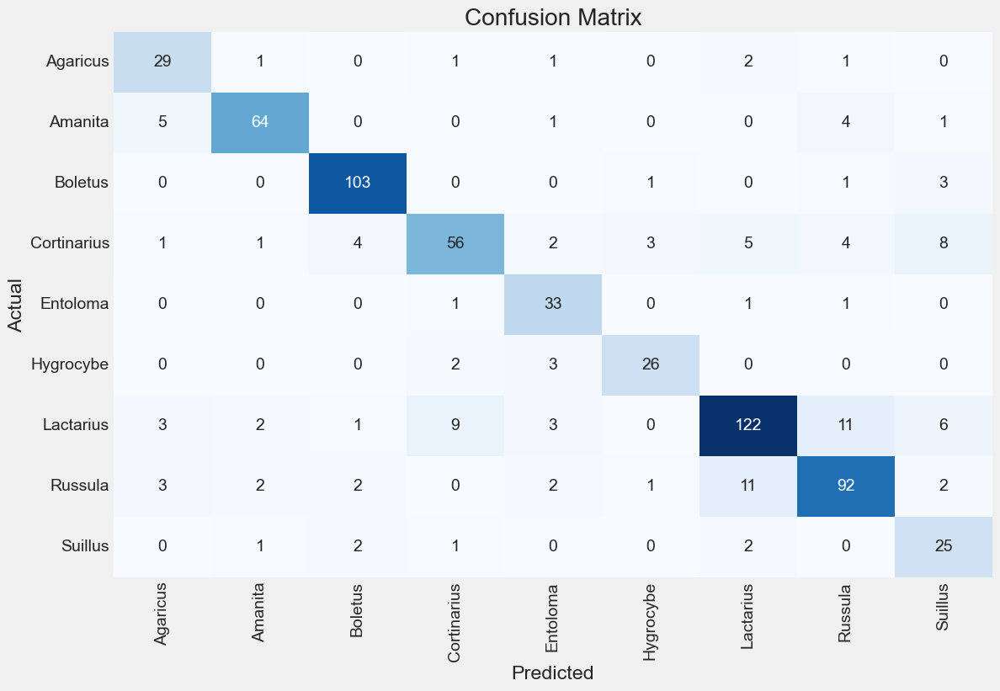

Classification Report:
----------------------
               precision    recall  f1-score   support

    Agaricus     0.7073    0.8286    0.7632        35
     Amanita     0.9014    0.8533    0.8767        75
     Boletus     0.9196    0.9537    0.9364       108
 Cortinarius     0.8000    0.6667    0.7273        84
    Entoloma     0.7333    0.9167    0.8148        36
   Hygrocybe     0.8387    0.8387    0.8387        31
   Lactarius     0.8531    0.7771    0.8133       157
     Russula     0.8070    0.8000    0.8035       115
     Suillus     0.5556    0.8065    0.6579        31

    accuracy                         0.8185       672
   macro avg     0.7907    0.8268    0.8035       672
weighted avg     0.8263    0.8185    0.8192       672



In [29]:
def predictor(test_gen):    
    y_pred= []
    error_list=[]
    error_pred_list = []
    y_true=test_gen.labels
    classes=list(test_gen.class_indices.keys())
    class_count=len(classes)
    errors=0
    preds=model.predict(test_gen, verbose=1)
    tests=len(preds)    
    for i, p in enumerate(preds):        
        pred_index=np.argmax(p)         
        true_index=test_gen.labels[i]  # labels are integer values        
        if pred_index != true_index: # a misclassification has occurred                                           
            errors=errors + 1
            file=test_gen.filenames[i]
            error_list.append(file)
            error_class=classes[pred_index]
            error_pred_list.append(error_class)
        y_pred.append(pred_index)
            
    acc=( 1-errors/tests) * 100
    msg=f'there were {errors} errors in {tests} tests for an accuracy of {acc:6.2f}'
    print_in_color(msg, (0,255,255), (100,100,100)) # cyan foreground
    ypred=np.array(y_pred)
    ytrue=np.array(y_true)
    f1score=f1_score(ytrue, ypred, average='weighted')* 100
    if class_count <=30:
        cm = confusion_matrix(ytrue, ypred )
        # plot the confusion matrix
        plt.figure(figsize=(12, 8))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)       
        plt.xticks(np.arange(class_count)+.5, classes, rotation=90)
        plt.yticks(np.arange(class_count)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes, digits= 4) # create classification report
    print("Classification Report:\n----------------------\n", clr)
    return errors, tests, error_list, error_pred_list, f1score

errors, tests, error_list, error_pred_list, f1score =predictor(test_gen)

### Function that prints the misclassification

In [30]:
def print_errors(error_list):
    if len(error_list) == 0:
        print_in_color('There were no errors in predicting the test set')
    else:
        if len(error_list)>50:
            print_in_color('There were over 50 misclassifications, the error list will not be printed')
        else:
            print ('Below is a list of test files that were miss classified \n')
            print ('{0:^30s}{1:^30s}'.format('Test File', ' Predicted as'))            
            for i in range(len(error_list)):
                fpath=error_list[i]                
                split=fpath.split('/') 
                slength=len(split)
                f=split[slength-2]+ '-' + split[slength-1]
                print(f'{f:^30s}{error_pred_list[i]:^30s}')

In [31]:
print_errors(error_list)

There were over 50 misclassifications, the error list will not be printed



The images below show 10 misclassified test images on left and an example of an image in the  misclassified class



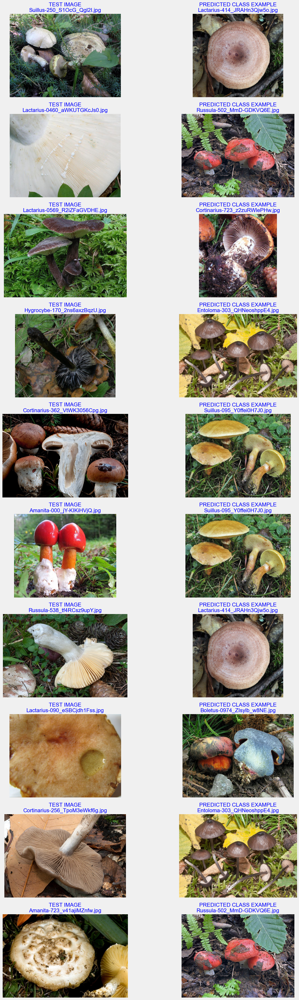

In [32]:
def show_misclassification(error_list, error_pred_list, test_gen):
    if len(error_list) == 0:
        print_in_color('there were no errors in predicting the test images')    
    else:
        if len(error_list)<10:
            length=len(error_list)
        else:
            length = 10 # show 10 images        
        msg='The images below show 10 misclassified test images on left and an example of an image in the  misclassified class'
        print_in_color(msg)
        test_files=test_gen.filenames
        plt.figure(figsize=(15, length * 5))
        for i in range(length):
            fpath=error_list[i] 
            test_img=plt.imread(fpath)
            pred_class= error_pred_list[i]
            # find a test file that is the same class as the pred_class
            for f in test_gen.filenames:
                split=list(f.split('/'))                
                klass=split[len(split)-2]
                if klass == pred_class:
                    pred_img_path= f      
            pred_img=plt.imread(pred_img_path)
            for j in range(2):   
                k=i*2 + j + 1            
                plt.subplot(length, 2, k)
                plt.axis('off')
                if j == 0:
                    plt.imshow(test_img)
                    split=fpath.split('/')
                    slength=len(split)
                    #print (split)
                    title=split[slength-2]+ '-' + split[slength-1]
                    title='TEST IMAGE\n'+ title
                    plt.title(title, color='blue', fontsize=16)
                else:                
                    plt.imshow(pred_img)
                    split=pred_img_path.split('/')
                    slength=len(split)
                    title=split[slength-2]+ '-' + split[slength-1]
                    title='PREDICTED CLASS EXAMPLE\n'+ title
                    plt.title(title, color='blue', fontsize=16)
        plt.show()

show_misclassification(error_list, error_pred_list, test_gen)

In [33]:
def save_model(subject, classes, img_size, f1score, working_dir):
    name=subject + '-' + str(len(classes)) + '-(' + str(img_size[0]) + ' X ' + str(img_size[1]) + ')'
    save_id=f'{name}-{f1score:5.2f}.h5'
    model_save_loc=os.path.join(working_dir, save_id)
    model.save(model_save_loc)
    msg= f'model was saved as {model_save_loc}'
    print_in_color(msg, (0,255,255), (100,100,100)) # cyan foreground

In [57]:
preds=model.predict(test_gen, verbose=1)
pred_class_list = []
for i, p in enumerate(preds):
    index=np.argmax(p)
    predicted_class=classes[index]
    pred_class_list.append(predicted_class)
Fseries=pd.Series(test_gen.filenames, name='Test File')
Lseries=pd.Series( pred_class_list, name='Class')
submit_df=pd.concat([Fseries, Lseries], axis=1)

NameError: name 'model' is not defined

12/12 [==============================] - 13s 1s/step


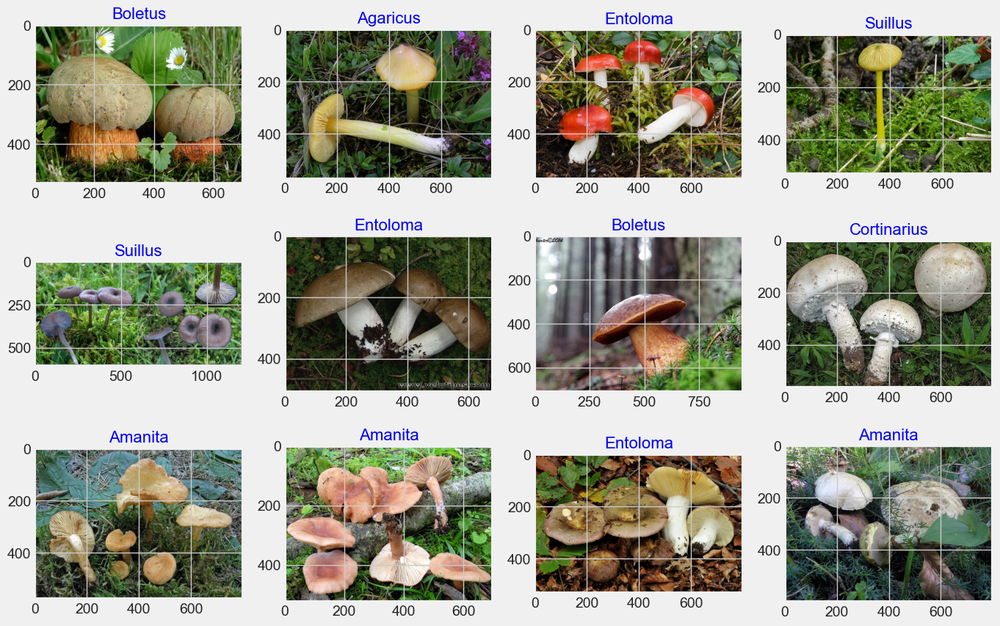

In [37]:
preds=model.predict(test_gen, verbose=1)
pred_class_list = []
for i, p in enumerate(preds):
    index=np.argmax(p)
    predicted_class=classes[index]
    pred_class_list.append(predicted_class)
Fseries=pd.Series(test_gen.filenames, name='Test File')
Lseries=pd.Series( pred_class_list, name='Class')
submit_df=pd.concat([Fseries, Lseries], axis=1)
plt.figure(figsize=(15, 10))
for i in range(12):
    fpath=submit_df['Test File'].iloc[i]
    label = submit_df['Class'].iloc[i]
    plt.subplot(3,4,i+1)
    img=plt.imread(fpath)/255
    plt.title(label, color='blue', fontsize=16)
    plt.imshow(img)
plt.show()